# LAB 7: Generate audio using IA!!

##PART 1 Text → Emotion → Music Generation Lab (PyTorch + MusicGen)

In this section, we turn a text prompt into music by first extracting its emotion using a pretrained transformer model, then feeding that emotion into a pretrained generative audio model.

In [ ]:
!pip install -qU pip setuptools wheel
!pip install -qU torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -qU transformers soundfile librosa matplotlib seaborn datasets jedi>=0.16





   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 51.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio
import torch

from transformers import AutoProcessor, MusicgenForConditionalGeneration, pipeline


In [ ]:
emotion_clf = pipeline(
    'text-classification',
    model='j-hartmann/emotion-english-distilroberta-base',
    return_all_scores=False,
    device=0 if torch.cuda.is_available() else -1
)

In [ ]:
EMOTION_PROMPT_MAP = {
    'joy': 'upbeat, cheerful, bright, lively, energetic, acoustic guitar and piano, light percussion, moderate tempo, sparkling synths, happy mood',
    'love': 'warm, romantic, soft, tender, heartfelt, piano and strings, gentle pads, slow tempo, melodic, soothing, emotional',
    'anger': 'aggressive, intense, powerful, distorted, heavy drums and guitars, fast tempo, driving rhythm, dark atmosphere, edgy, high energy',
    'fear': 'dark, eerie, suspenseful, ominous, atmospheric synths, low drones, slow tempo, tension, haunting, mysterious, unsettling',
    'surprise': 'playful, bright, unexpected, dynamic, lively, synth arpeggios, medium tempo, whimsical, energetic, sparkling, sudden changes',
    'sadness': 'melancholic, slow, soft, sorrowful, gentle piano and pads, low energy, reflective, moody, introspective, ambient textures',
    'neutral': 'calm, relaxed, ambient, peaceful, soft textures, smooth pads, moderate tempo, balanced, minimalistic, unobtrusive, soothing'
}

def map_emotion_to_prompt(emotion_label, base_text):
    mod = EMOTION_PROMPT_MAP.get(emotion_label.lower(), EMOTION_PROMPT_MAP['neutral'])
    return f"{base_text}. Style: {mod}."

In [ ]:
music_pipeline = pipeline("text-to-audio", model="facebook/musicgen-small")



Device set to use cuda:0


In [ ]:
from IPython.display import Audio

def text_to_music_play_only(text_prompt, spect=True):
    # From the text input, try to find the emotion using a pre trained model
    res =
    if isinstance(res, list):
        label = res[0]['label']
        score = res[0]['score']
    else:
        label = res['label']
        score = res.get('score', None)

    print(f'Emotion detected: {label} (score: {score})')

    # For MusicGen prompt you need to map the emotion found with the emotion_prompt_map
    gen_prompt =
    print('Generation prompt:', gen_prompt)

    # Generate audio using a pre trained model
    audio_dict =
    wav = audio_dict["audio"].squeeze()
    sr = audio_dict["sampling_rate"]

    if spect==True:
        # Plot mel-spectrogram
        S = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=128, fmax=16000)
        S_db = librosa.power_to_db(S, ref=np.max)

        plt.figure(figsize=(10, 3))
        librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', fmax=16000)
        plt.colorbar(format='%+2.0f dB')
        plt.title('Generated Audio Mel-Spectrogram')
        plt.tight_layout()
        plt.show()

    # Play audio in notebook
    Audio(wav, rate=sr)
    return wav, label, gen_prompt

In [ ]:
text = ""
wav, label, gen_prompt=text_to_music_play_only(text)

In [ ]:
Audio(wav, rate=sr)

##PART 2 Training a Transformer for Classical Piano Music using GiantMIDI-Piano

This lab is a complete, hands-on course for training a generative Transformer on GiantMIDI-Piano (classical piano MIDI) and then generate music. You will:

- Download the GiantMIDI-Piano MIDI files

- Run exploratory data analysis (EDA): composer counts, nationality representation (where possible), durations, tempo and key distributions

- Tokenize MIDI into sequences suitable for a Transformer (REMI or simple event tokens)

- Train a general classical piano Transformer on the whole dataset

- generate music

In [ ]:
!pip -q install miditoolkit miditok torch torchvision torchaudio pytorch-lightning pandas matplotlib seaborn tqdm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Exploratory Data Analysis (EDA)

Explore the "full_music_pieces_youtube_similarity_pianosoloprob_split.csv" metadata file. As you can see, you have much more lines than the number of midi files.
Therefore select only the lines for those giant_midi_piano is 1.

Represent:

- Composer frequency
- Nationality
- Duration of the files

In [ ]:
import pandas as pd
def read_csv_to_meta_dict(csv_path):
    """Read csv file to meta_dict."""
    lines = []
    with open(csv_path, 'r') as fr:
        for line in fr.readlines():
            line = line.split('\n')[0].split('\t')
            lines.append(line)
    return lines

In [ ]:
csv_path="/content/drive/MyDrive/Piano_files/full_music_pieces_youtube_similarity_pianosoloprob_split.csv"
meta_dict = read_csv_to_meta_dict(csv_path)
df = pd.DataFrame(meta_dict[1:], columns=meta_dict[0])
midi_meta = df[df['giant_midi_piano'] == '1']


**Compare the size of your metadata file and the number of midi files, then do all the plots**

In [ ]:
from pathlib import Path

midi_folder = Path("/content/drive/MyDrive/Piano_files/data_midi")
midi_files = list(midi_folder.glob("*.mid")) + list(midi_folder.glob("*.midi"))
num_midi = len(midi_files)
print(f"Number of MIDI files in folder: {num_midi}")
print(f"Shape of my metadata: {midi_meta.shape[0]}")

Number of MIDI files in folder: 10855
Shape of my metadata: 10855


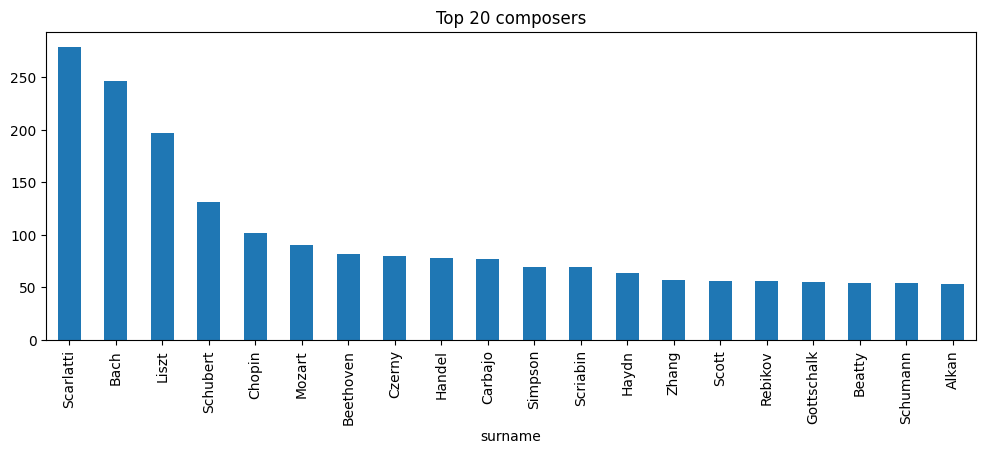

In [ ]:
import matplotlib.pyplot as plt

composer_counts = midi_meta['surname'].value_counts()
composer_counts.head(20).plot(kind='bar', figsize=(12,4), title="Top 20 composers")
plt.show()

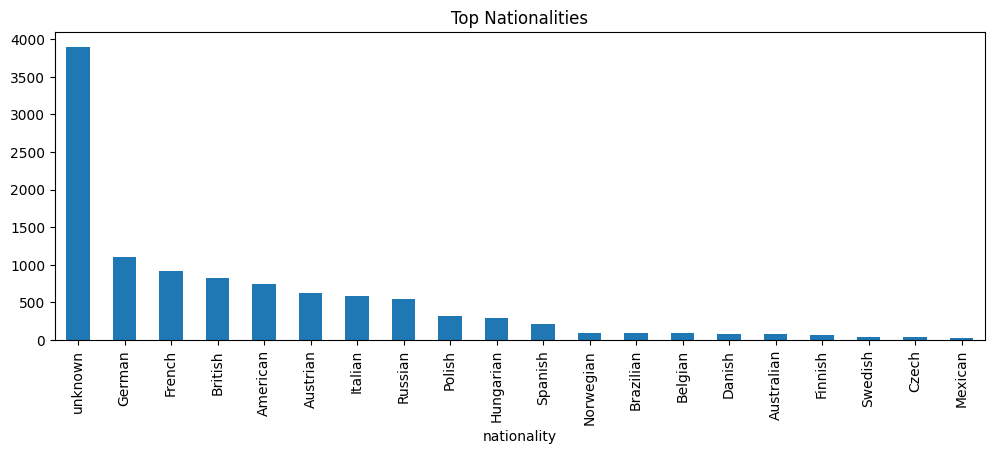

In [ ]:
nationality_counts = midi_meta['nationality'].fillna('unknown').value_counts()
nationality_counts.head(20).plot(kind='bar', figsize=(12,4), title="Top Nationalities")
plt.show()

## Tokenization

Tokenization is the process of converting MIDI events (notes, durations, velocities, control changes) into a sequence of discrete tokens that a model can process.

MIDI files contain a lot of structured, time-based information:

- NOTE_ON (pitch + velocity)

- NOTE_OFF (pitch)

- TIME_SHIFT (duration between events)

- CONTROL_CHANGE (pedal, modulation, etc.)

Neural networks like Transformers cannot directly read MIDI files. They operate on sequences of numbers. Tokenization converts the MIDI events into integers (or IDs) that the model can understand.

What is inside a TokSequence (.tokens, .ids, etc.)?

When Miditok tokenizes a MIDI file, it returns one or several TokSequence objects. Each TokSequence contains two parallel representations of the same musical events.

- .tokens is a list of string tokens such as "Note-On_64", "Duration_120", "Time-Shift_10", or "Bar". These human-readable labels describe the musical events.

- .ids is the numerical version of .tokens: each token string is mapped to an integer ID in the tokenizer vocabulary (similar to how words are mapped to IDs in NLP models). The model trains on these integer IDs, not the strings.


**Convert MIDI to event sequences using a tokenizer (REMI, MuMIDI, or simple NOTE_ON/OFF/TIME_SHIFT/VELOCITY).**

**Save sequences as .npy files for fast loading**

In [ ]:
!pip -q install miditok miditoolkit
from miditok import REMI, TokenizerConfig
from miditoolkit import MidiFile
from tqdm import tqdm
import numpy as np

In [ ]:
from tqdm import tqdm


midi_folder = Path("/content/drive/MyDrive/Piano_files/data_midi")
midi_files = list(midi_folder.glob("*.mid")) + list(midi_folder.glob("*.midi"))

config = TokenizerConfig(
    use_chords=True,
    use_rests=True,
    use_tempos=True,
    use_time_signatures=True,
    use_programs=False,     # only piano
    one_token_stream=True,
)


tokenizer = REMI(config)
tokenizer.save("/content/drive/MyDrive/Piano_files/tokenizer.json")

token_sequences = []

bad_files = []

for path in tqdm(midi_files, desc="Tokenizing MIDI files"):
    if not path.exists():
        print(f"File not found: {path}")
        continue

    try:
        tok = tokenizer.encode(str(path))[0]

        #
        if tok is None or tok.ids is None or len(tok.ids) == 0:
            print(f"Invalid or empty tokens: {path.name}")
            bad_files.append(path)
            continue

        token_sequences.append(np.array(tok.ids))

    except Exception as e:
        print(f"Error processing {path.name}: {e}")
        bad_files.append(path)
        continue

# save
output_file = "midi_tokens.npy"
np.save("/content/drive/MyDrive/Piano_files/midi_tokens.npy", np.array(token_sequences, dtype=object), allow_pickle=True)

## Train a general classical piano Transformer on the whole dataset

- Split the data into train (80%), val (10%) and test (10)
- create your model
- train and test your model

We use the SimpleMusicTransformer implementation (encoder‑only).

- nn.Embedding: maps token ids to dense vectors; initial learnable embedding.

- PositionalEncoding: injects position information since transformer is permutation‑invariant.

- transpose(0,1): PyTorch Transformer expects sequence first (seq_len, batch, d_model).

- TransformerEncoder: stack of self‑attention + feed‑forward layers.

- self.to_logits: final linear layer producing unnormalized scores per token.

**Create Split train 80% / val 10% / test 10% + composer tokens**

In [ ]:
import numpy as np
import torch
train_seqs = np.load(
    "/content/drive/MyDrive/Piano_files/train_tokens.npy",
    allow_pickle=True
)

val_seqs = np.load(
    "/content/drive/MyDrive/Piano_files/val_tokens.npy",
    allow_pickle=True
)

test_seqs = np.load(
    "/content/drive/MyDrive/Piano_files/test_tokens.npy",
    allow_pickle=True
)

In [ ]:
'''
Your Transformer needs to know how many different tokens exist
the model must create:

an embedding matrix of shape [vocab_size, d_model]

a final linear layer of shape [d_model, vocab_size]
'''


tokenizer = REMI(params="/content/drive/MyDrive/Piano_files/tokenizer.json")

vocab_size = tokenizer.vocab_size
print("Vocab size =", vocab_size)

Vocab size = 435


In [ ]:
import torch
import torch.nn as nn
import math

class MusicTransformer(nn.Module):
    def __init__(self, vocab_size, d_model=256, nhead=4, num_layers=4):
        super().__init__()
        self.embed =

        self.pos =

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=,
            nhead=,
            dim_feedforward=,
            dropout=,
            activation="",
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.fc = nn.Linear(d_model, vocab_size)

    def forward(self, x):
        device = x.device
        seq_len = x.size(1)
        mask = torch.triu(torch.ones(seq_len, seq_len, device=device) * float('-inf'), diagonal=1)

        x = self.embed(x) + self.pos[:, :seq_len]
        x = self.transformer(x, mask=mask)
        return self.fc(x)


**Windows function**

Your Transformer cannot handle millions of tokens at once. It expects fixed-length sequences (like 1024 tokens) for training.

So we “cut” your long sequence of tokens into smaller, overlapping “windows”:

In [ ]:
def make_windows(sequence, seq_len=512, stride=256):
    windows = []
    L = len(sequence)
    for i in range(0, L - seq_len, stride):
        windows.append(sequence[i:i+seq_len])
    return windows


**Dataset and dataloead**

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class MusicDataset(Dataset):
    def __init__(self, sequences, seq_len=1024):
        self.samples = []
        for seq in sequences:
            self.samples += make_windows(seq, seq_len)
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        s = torch.tensor(self.samples[idx], dtype=torch.long)
        return s[:-1], s[1:]   # input, target

train_ds = MusicDataset(train_seqs, seq_len=512)
val_ds   = MusicDataset(val_seqs,   seq_len=512)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=16)


**Train your model**

In [ ]:
def evaluate(val_loader):
    model.eval()
    total_loss = 0
    total_tokens = 0
    loop = tqdm(val_loader, desc="Validation", leave=False)
    with torch.no_grad():
        for x, y in loop:
            x = x.cuda()
            y = y.cuda()

            logits = model(x)
            loss = loss_fn(
                logits.view(-1, vocab_size),
                y.view(-1)
            )

            total_loss += loss.item() * y.numel()
            total_tokens += y.numel()

    model.train()
    return total_loss / total_tokens

In [ ]:
from tqdm import tqdm

model = MusicTransformer(vocab_size).cuda()
opt = torch.optim.Adam(model.parameters(), lr=1e-4)
loss_fn = nn.CrossEntropyLoss()

train_losses = []
val_losses = []

for epoch in range(5):
    model.train()
    total_loss = 0

    loop = tqdm(train_loader, desc=f"Epoch {epoch}", leave=True)
    for x, y in loop:
        x, y = x.cuda(), y.cuda()
        logits = model(x)
        loss = loss_fn(logits.reshape(-1, vocab_size), y.reshape(-1))

        opt.zero_grad()
        loss.backward()
        opt.step()

        total_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    val_loss = evaluate(val_loader)
    val_losses.append(val_loss)

    print(f"Epoch {epoch} completed — train_loss: {avg_train_loss:.4f}, val_loss: {val_loss:.4f}")

    # Save checkpoint
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': opt.state_dict(),
        'train_loss': avg_train_loss,
        'val_loss': val_loss
    }, f"/content/drive/MyDrive/Piano_files/general_model_epoch{epoch}.pt")

# Save the full loss history too
np.save("/content/drive/MyDrive/Piano_files/train_losses.npy", np.array(train_losses))
np.save("/content/drive/MyDrive/Piano_files/val_losses.npy", np.array(val_losses))


Epoch 0: 100%|██████████| 27050/27050 [33:10<00:00, 13.59it/s, loss=2.37]


Epoch 0 completed — train_loss: 2.5709, val_loss: 2.3075


Epoch 1: 100%|██████████| 27050/27050 [33:03<00:00, 13.64it/s, loss=2.45]


Epoch 1 completed — train_loss: 2.3095, val_loss: 2.1663


Epoch 2:  90%|████████▉ | 24260/27050 [29:40<03:24, 13.63it/s, loss=2.23]

## Plot train and validation loss  vs epochs

In [ ]:
epochs = [0, 1, 2, 3, 4, 5, 6]
train_losses = []
val_losses = []

for e in epochs:
    ckpt_path = f"/content/drive/MyDrive/Piano_files/general_model_epoch{e}.pt"
    #checkpoint = torch.load(ckpt_path)
    checkpoint = torch.load(ckpt_path, map_location="cpu")

    train_losses.append(checkpoint.get("train_loss", np.nan))
    val_losses.append(checkpoint.get("val_loss", np.nan))

train_losses = np.array(train_losses)
val_losses = np.array(val_losses)

# Plot
import matplotlib.pyplot as plt
plt.figure(figsize=(8,5))
plt.plot(epochs, train_losses, label="Train Loss")
plt.plot(epochs, val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()
plt.show()


## Load the model from your checkpoint

In [ ]:
ckpt = torch.load("/content/drive/MyDrive/Piano_files/general_model_epoch6.pt", map_location="cpu")

tokenizer = REMI(params="/content/drive/MyDrive/Piano_files/tokenizer.json")
vocab_size = tokenizer.vocab_size
print("Vocab size =", vocab_size)
#model = MusicTransformer(vocab_size).cuda()
model = MusicTransformer(vocab_size)

# Load weights
model.load_state_dict(ckpt['model_state_dict'])
model.eval()

Vocab size = 435


MusicTransformer(
  (embed): Embedding(435, 256)
  (transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-3): 4 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
        (linear1): Linear(in_features=256, out_features=512, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=512, out_features=256, bias=True)
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=256, out_features=435, bias=True)
)

## Generate a sequence of tokens

In [ ]:

import torch.nn.functional as F
def generate(model, start_token, max_len=1024, temperature=1.0):
    seq = [start_token]
    model.eval()
    for _ in range(max_len):
        #inp = torch.tensor([seq]).long().cuda()
        inp = torch.tensor([seq]).long()
        with torch.no_grad():
            logits = model(inp)
            # Add temperature sampling
            probs = F.softmax(logits[0, -1] / temperature, dim=-1)
            next_tok = torch.multinomial(probs, num_samples=1).item()
        seq.append(next_tok)
    return seq

generated_tokens = generate(model, start_token=4, max_len=1024, temperature=1.0) #temp=randomess of generation (high temperatures, the model’s output is more diverse and creative)
print("Generated tokens:", len(generated_tokens))

Generated tokens: 1025


[]

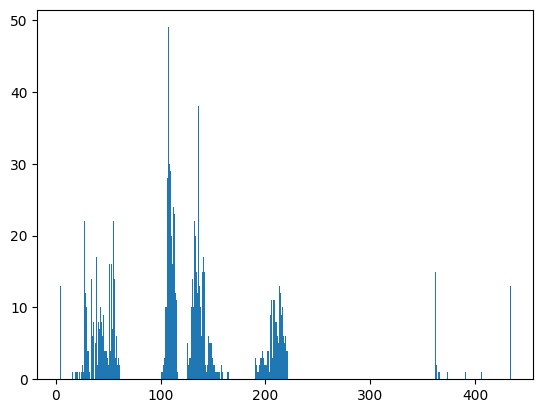

In [ ]:
plt.hist(generated_tokens,bins=435)
plt.plot()

In [ ]:
from collections import Counter
top5 = Counter(generated_tokens).most_common(5)
print(top5)

[(107, 49), (136, 38), (108, 30), (109, 29), (106, 28)]


##Convert tokens to MIDI

In [ ]:
import shutil
from pathlib import Path

final_destination = "/content/drive/MyDrive/Piano_files/generated_music.mid"
Path(final_destination).parent.mkdir(parents=True, exist_ok=True)


midi_object = tokenizer.decode()
temp_local_path = "/content/temp_generated2.mid"
midi_object.dump_midi(temp_local_path)

shutil.move(temp_local_path, final_destination)




In [ ]:
import os
check_path = "/content/drive/MyDrive/Piano_files/generated_music.mid"

if os.path.exists(check_path):
    print(f" File exists on disk! Size: {os.path.getsize(check_path)} bytes")
else:
    print("File is still missing from this path.")

 File exists on disk! Size: 1821 bytes


## Convert to .wav and listen it

In [ ]:
!apt-get install -y fluidsynth
!pip -q install pyfluidsynth

In [ ]:
import os

midi_input = "/content/drive/MyDrive/Piano_files/generated_music.mid"
wav_output = "/content/generated_music.wav"
# Standard location for the default SoundFont in Colab after apt-get
soundfont = "/usr/share/sounds/sf2/FluidR3_GM.sf2"

# Run the conversion
!fluidsynth -ni $soundfont $midi_input -F $wav_output -r 44100

In [ ]:
from IPython.display import Audio

if os.path.exists(wav_output):
    print("Playing your generated music:")
    display(Audio(wav_output))
else:
    print("WAV file was not created. Check for errors above.")

Playing your generated music:
